In [1]:
# ==========================================
# Cell 1: Imports and Setup
# ==========================================
import os
import pickle
import numpy as np
from astropy.cosmology import FlatLambdaCDM
from astropy.units import Quantity
from astropy.table import Table

import slsim.Sources as sources
import slsim.Deflectors as deflectors
from slsim.Lenses.lens_pop import LensPop

import warnings
warnings.filterwarnings("ignore")

%load_ext autoreload
%autoreload 2

# Define output directory for the pickled objects
output_dir = "../saved_objects"
os.makedirs(output_dir, exist_ok=True)

In [2]:
# ==========================================
# Cell 2: Cosmology & Load Pre-computed Catalogs
# ==========================================
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

# Define Sky Areas (Used by slsim to calculate population densities)
sky_area_galaxy = Quantity(10, "deg2")
# sky_area_quasar = Quantity(24.0, "deg2")
sky_area_quasar = Quantity(10.0, "deg2")

print("Loading pre-computed SkyPy and Quasar catalogs...")
red_galaxy_catalog = Table.read(f'../catalogs/skypy_red_galaxies_{sky_area_galaxy.value}deg2.fits', format='fits')
blue_galaxy_catalog = Table.read(f'../catalogs/skypy_blue_galaxies_{sky_area_galaxy.value}deg2.fits', format='fits')
all_galaxy_catalog = Table.read(f'../catalogs/skypy_all_galaxies_{sky_area_galaxy.value}deg2.fits', format='fits')
# quasar_host_catalog = Table.read(f'../catalogs/agile_qsos.fits', format='fits')
quasar_host_catalog = Table.read(f'../catalogs/slsim_qsos.fits', format='fits')
print("Catalogs loaded successfully.")

Loading pre-computed SkyPy and Quasar catalogs...
Catalogs loaded successfully.


In [3]:
quasar_host_catalog[:5]

z,M_i,ps_mag_i,ps_mag_z,ps_mag_g,ps_mag_y,ps_mag_r,M,coeff,ellipticity,physical_size,stellar_mass,angular_size,mag_g,mag_r,mag_i,mag_z,mag_y,vel_disp,black_hole_mass_exponent,eddington_ratio
,,,,,,,,,,kpc,,rad,,,,,,,,
float64,float64,float64,float64,float64,float64,float64,float64,float64[5],float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
2.6733058817920896,-23.156811947270718,22.699280982619257,22.573441476270638,22.867231004174695,22.406505044668652,22.693723562435327,-22.143534437094548,0.17072368035527322 .. 0.013000041342722965,0.2292037945668804,7.907702691981965,202958358511.37683,4.823137597225188e-06,24.640683563366558,24.593562489635794,24.45787340367282,24.470345208695065,24.418115143917284,185.5868702396025,8.349087258321818,0.16299687635770727
2.213978540095596,-16.910254266382562,28.50540477574676,28.213679081991852,28.637391880042202,28.246826882760118,28.708687327950535,-18.07814572756292,0.10976714557846509 .. 0.07935282876851857,0.3025578707982208,1.5494691038932298,3148900355.6401424,9.097029593335258e-07,28.900110081083668,28.625191147125975,28.441576788645044,28.194557898954933,27.908860103296938,43.51434046962917,5.590060248790423,0.2973540833934609
1.0334680339650515,-13.65266976021199,29.96749154582042,30.08221745160999,30.292161668802194,29.862956556211106,29.932325251124567,-14.385502034833436,0.11084385013377179 .. 0.25732754934363045,0.1471526775478167,1.9263650820523093,39749916.49988755,1.1574936603037354e-06,30.14406354886723,29.802809012193514,29.462139643227502,29.04220042168486,28.934698436434786,29.366821111557236,4.842063700056003,0.10356854678992343
1.0333885180302627,-16.146258400373494,27.473775785979488,27.571587208095398,27.763986393323233,27.36744756735752,27.430667759346182,-16.874728031798714,0.4962950200274774 .. 0.09932351247907849,0.6792769399658105,0.8582667212297995,729882265.9342874,5.156324615171219e-07,28.242892894031748,27.686763955784457,27.153692466228883,26.56960240239053,26.390072932248728,38.783858554457495,5.371141755337447,0.24339562439912382
0.626425179895944,-12.607134219613204,29.839860233204522,29.985461689789346,29.91355242442653,29.887751534716916,29.944793864920612,-13.140645686011469,0.057174666690232516 .. 0.23056789883967038,0.647661934802537,0.5028325363958789,9762452.49448851,3.574764529254164e-07,30.374498246172315,29.606069679699402,29.09200950959768,29.000030994788418,28.893670740540614,24.823565974322037,4.5223553741626565,0.13627945974032102


In [4]:
# ==========================================
# Cell 3: Define Source and Deflector Populations
# ==========================================
kwargs_deflector_cut = {"band": "i", "band_min": 19, "band_max": 26, "z_min": 0.01, "z_max": 2.5}
kwargs_source_galaxy_cut = {"band": "i", "band_max": 28, "z_min": 0.01, "z_max": 5.0}
kwargs_source_quasar_cut = {"band": "i", "band_max": 28, "z_min": 0.01, "z_max": 5.0}

lens_galaxy_pop = deflectors.EllipticalLensGalaxies(
    galaxy_list=red_galaxy_catalog,
    kwargs_cut=kwargs_deflector_cut,
    gamma_pl={"mean": 2.0, "std_dev": 0.16},
    cosmo=cosmo,
    sky_area=sky_area_galaxy,
    kwargs_mass2light={}
)

source_galaxy_pop = sources.Galaxies(
    galaxy_list=blue_galaxy_catalog, 
    kwargs_cut=kwargs_source_galaxy_cut, 
    cosmo=cosmo, 
    sky_area=sky_area_galaxy, 
    catalog_type="skypy"
)

field_galaxy_pop = sources.Galaxies(
    galaxy_list=all_galaxy_catalog, 
    kwargs_cut=kwargs_source_galaxy_cut, 
    cosmo=cosmo, 
    sky_area=sky_area_galaxy, 
    catalog_type="skypy"
)

source_quasar_host_pop = sources.PointPlusExtendedSources(
    point_plus_extended_sources_list=quasar_host_catalog, 
    cosmo=cosmo, 
    sky_area=sky_area_quasar, 
    point_source_type="quasar", 
    # extended_source_type="double_sersic", 
    extended_source_type="single_sersic",
    kwargs_cut=kwargs_source_quasar_cut
)

In [5]:
# ==========================================
# Cell 4: Generate Lensed Quasars
# ==========================================
MAX_LENSES = 50_000

lensed_quasars_pop = LensPop(
    deflector_population=lens_galaxy_pop,
    source_population=source_quasar_host_pop,
    cosmo=cosmo,
    sky_area=Quantity(40000, "deg2"), # Scaled up to draw enough samples
)

kwargs_lens_cut = {
    "min_image_separation": 0.5,
    "second_brightest_image_cut": {"i": 26},
}

print("Drawing Lensed Quasars...")
lensed_quasars = []
while True:
    lensed_quasars_new = lensed_quasars_pop.draw_population(kwargs_lens_cuts=kwargs_lens_cut, speed_factor=10000)
    lensed_quasars.extend(lensed_quasars_new)
    if len(lensed_quasars) >= MAX_LENSES:
        break

lensed_quasars = lensed_quasars[:MAX_LENSES]  # Limit to MAX_LENSES

print(f"Total Lensed Quasars generated: {len(lensed_quasars)}")

with open(os.path.join(output_dir, f"lensed_quasars_{len(lensed_quasars)}.pkl"), "wb") as f:
    pickle.dump(lensed_quasars, f)
print(f"Lensed quasars saved to {os.path.join(output_dir, f'lensed_quasars_{len(lensed_quasars)}.pkl')}")

Drawing Lensed Quasars...
Total Lensed Quasars generated: 50000
Lensed quasars saved to ../saved_objects/lensed_quasars_50000.pkl


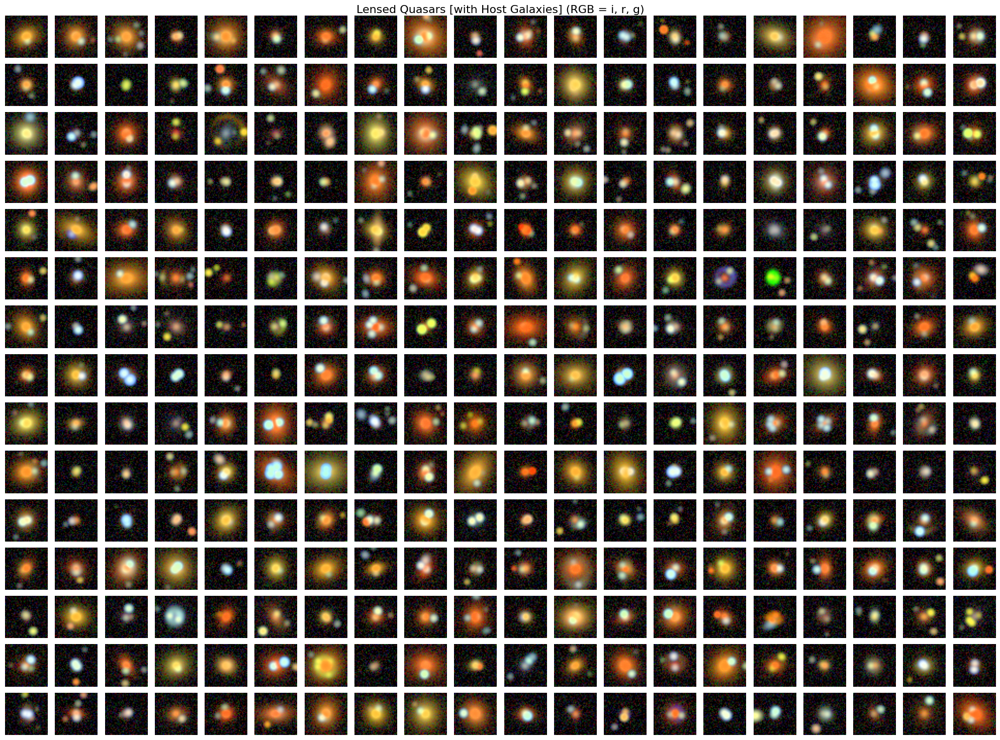

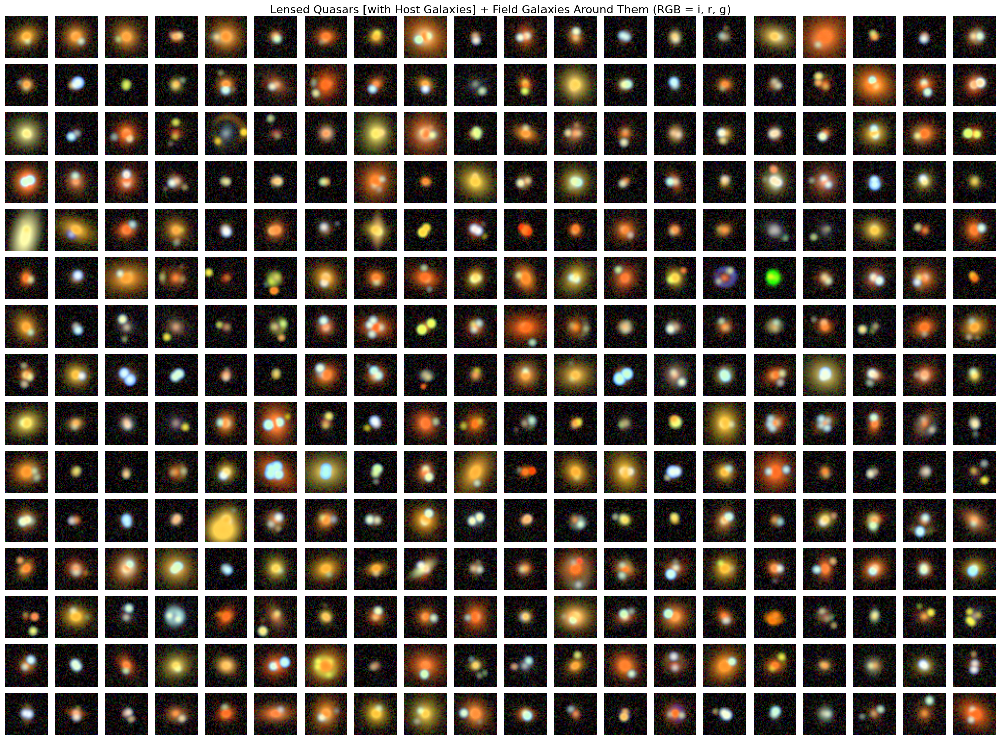

In [ ]:
# # Some images to visualize the generated lensed quasars
# from utils import plot_montage

# selected_lenses = lensed_quasars[300:600]  # Select lenses 300 to 600 for plotting

# plot_montage(selected_lenses, number_to_plot=300, num_cols=20, random_seed=42,
#             plot_title="Lensed Quasars [with Host Galaxies] (RGB = i, r, g)");

# # add field galaxies to the lenses and plot again
# selected_lenses_with_field_galaxies = selected_lenses.copy()  # Start with the original selected lenses
# for lens in selected_lenses_with_field_galaxies:
#     lens.add_field_galaxies(field_galaxies=field_galaxy_pop.draw_galaxies(area=Quantity(20, "arcsec2")))

# plot_montage(selected_lenses_with_field_galaxies, number_to_plot=300, num_cols=20, random_seed=42,
#             plot_title="Lensed Quasars [with Host Galaxies] + Field Galaxies Around Them (RGB = i, r, g)");

Text(0, 0.5, 'i - r')

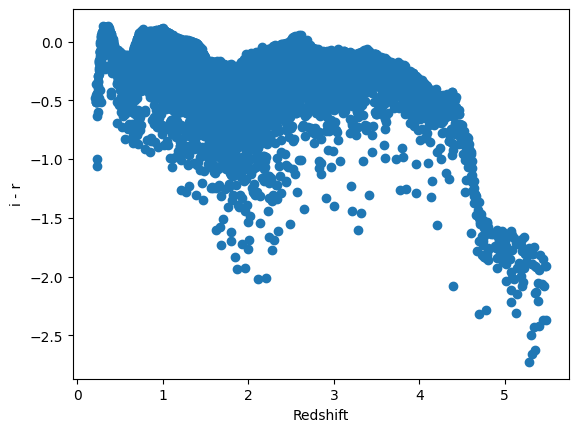

In [31]:
from matplotlib import pyplot as plt
plt.scatter(quasar_host_catalog['z'], quasar_host_catalog['ps_mag_i'] - quasar_host_catalog['ps_mag_r'])
plt.xlabel('Redshift')
plt.ylabel('i - r')